In [1]:
# cell for packages/functions/etc
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from tensorflow.keras.datasets import mnist
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.datasets import fetch_openml
from PIL import Image as im
from sklearn.model_selection import train_test_split

## *A short survey on Dimension Reduction Techniques*
We have familiarized ourselves with a dimensionality reduction technique at the beginning of the course, PCA (Principal Component analysis), where the embeddings for each data point are extracted as the coordinates in the original vector space (of dimension $n$) but with a new set of basis so that every time we make an $m$-dimensional approximation of the data points, the loss from the MSE/MAE metric is minimized.
This method clearly have the following shortcomings:


*   Less interpretability of the principal components significance of the components.
*   Tradeoffs between information retention and dimensional reduction.  

The focus of dimensionality reduction techniques, however, is to be able to present the information in less dimensions with the least information loss possible, thus, more techniques were introduced after PCA to improve on this latter disadvantage. Let us first present some examples of how PCA is not suitable for presenting some (small) datasets in both 2D and 3D spaces.

In [ ]:
X, y = load_digits(return_X_y=True)                                             # digits dataset as the first example (1797 gray-scaled images of handwritten digits of size 8*8) which is a subjectively small dataset
X.shape, y.shape                                                                # each image in X has a representation given by 64 numbers, each number in the range [0,255] to indicate the color of the corresponding pixel; y is the label given to each image w.r.t order

((1797, 64), (1797,))

In [ ]:
digits_scale = MinMaxScaler(feature_range=(0,255))                          # scaling the dataset
digits_scale.fit(X)
X_scaled = digits_scale.transform(X)

In [ ]:
pca = PCA(2)                                                                # let us try to represent the dataset in the real 2D space

In [ ]:
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)

In [ ]:
x_coords = X_pca[:, 0]                                                      # plotting out the 2D PCA representation
y_coords = X_pca[:, 1]
labels = y
data_pca_2d = {'x': x_coords, 'y': y_coords, 'label': labels}
df_pca_2d = pd.DataFrame(data=data_pca_2d)
fig_pca_2d = px.scatter(df_pca_2d, x='x', y='y', color='label')
fig_pca_2d.show()

In [ ]:
pca = PCA(3)                                                                # in the real 3D space

In [ ]:
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)

In [ ]:
x_coords = X_pca[:, 0]
y_coords = X_pca[:, 1]
z_coords = X_pca[:, 2]
labels = y
data_pca_3d = {'x': x_coords, 'y': y_coords, 'z': z_coords, 'label': labels}
df_pca_3d = pd.DataFrame(data=data_pca_3d)
fig_pca_3d = px.scatter_3d(df_pca_3d, x='x', y='y', z='z', color='label')
fig_pca_3d.show()

In [ ]:
X_fmnist, y_fmnist = fetch_openml(name='Fashion-MNIST', return_X_y=True)      # FMNIST for the second example (70000 gray-scaled images of clothing items, 10 categories) so arguably a more complicated dataset than digits

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning:

The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.



In [ ]:
fmnist_scaler = MinMaxScaler(feature_range=(0,255))
fmnist_scaler.fit(X_fmnist)
X_fmnist = fmnist_scaler.transform(X_fmnist)

In [ ]:
pca = PCA(2)                                                                  # let us try to represent FMNIST on the 2D real space using PCA
X_fmnist_pca = pca.fit_transform(X_fmnist)

In [ ]:
x_coords = X_fmnist_pca[:, 0]
y_coords = X_fmnist_pca[:, 1]
labels = y_fmnist
data_pca_fmnist = {'x': x_coords, 'y': y_coords, 'label': labels}
df_pca_fmnist = pd.DataFrame(data=data_pca_fmnist)
fig_pca_fmnist = px.scatter(df_pca_fmnist, x='x', y='y', color='label')
fig_pca_fmnist.show()

In [ ]:
pca = PCA(3)                                                                            # 3D this time
X_fmnist_pca = pca.fit_transform(X_fmnist)

In [ ]:
x_coords = X_fmnist_pca[:, 0]
y_coords = X_fmnist_pca[:, 1]
z_coords = X_fmnist_pca[:, 2]
labels = y_fmnist
data_pca_fmnist = {'x': x_coords, 'y': y_coords, 'z': z_coords, 'label': labels}
df_pca_fmnist = pd.DataFrame(data=data_pca_fmnist)
fig_pca_fmnist = px.scatter_3d(df_pca_fmnist, x='x', y='y', z='z', color='label')
fig_pca_fmnist.show()

Overall, the bigger and more complex the dataset is, the harder PCA underperforms as a dimensionality reduction tool.
Another method was introduced later to improve the information retention a little bit in exchange for computing time, called Multidimensional Scaling (MDS). The main idea for this method is: given a dataset $X$, suppose we can calculate similarities/dissimilarities between its datapoints in some fashion, MDS will try to find a configuration in the representation space (2D or 3D) to best approximate the similarities/dissimilarities, and at the same time minimizes the loss/stress function defined by:
$$\sum_{i < j} d_{ij}(X) - \hat{d}_{ij}(X)$$
where $d_{ij}(X)$ is the similarity/dissimilarity between the $i$-th point and the $j$-th point, $\hat{d}_{ij}(X)$ is the similarity/dissimilarity that the algorithm is currently using for the same pair of points.  
A few advantages of this method:

*   The loss/stress function directly involves the similarities/dissimilarities directly.
*   The results yielded are somewhat more accurate than PCA.  

While the disadvantages are related to the definition of the method by itself:

*   Requires more computing power/time, as similarity/dissimilarity is customizable.
*   The results yielded are sensitive to choices of similarity/dissimilarity.  

Let us attempt to find some examples on how well MDS performs as a dimensional reduction tool.

In [ ]:
X, y = load_digits(return_X_y=True)                                             # digits again
X.shape, y.shape

((1797, 64), (1797,))

In [ ]:
digits_scale = MinMaxScaler(feature_range=(0,255))                              # scaling the dataset
digits_scale.fit(X)
X_scaled = digits_scale.transform(X)

In [ ]:
mds = MDS(n_components=2, metric=True, dissimilarity='euclidean', normalized_stress='auto')       # 2D case
X_mds=mds.fit_transform(X_scaled)

In [ ]:
x_coords = X_mds[:, 0]                                                          # scatterplot
y_coords = X_mds[:, 1]
x_coords.shape, y_coords.shape
data_mds_2d = {'x' : x_coords, 'y': y_coords, 'label' : y}
df_mds_2d = pd.DataFrame(data=data_mds_2d)
df_mds_2d.head()
fig_mds_2d = px.scatter(df_mds_2d, x='x', y='y', color='label')
fig_mds_2d.show()

In [ ]:
mds = MDS(n_components=3, metric=True, dissimilarity='euclidean', normalized_stress='auto')       # 3D case
X_mds_3d=mds.fit_transform(X_scaled)

In [ ]:
x_coords_3d = X_mds_3d[:, 0]
y_coords_3d = X_mds_3d[:, 1]
z_coords_3d = X_mds_3d[:, 2]
x_coords_3d.shape, y_coords_3d.shape, z_coords_3d.shape
data_mds_3d = {'x' : x_coords_3d, 'y': y_coords_3d, 'z': z_coords_3d,'label' : y}
df_mds_3d = pd.DataFrame(data=data_mds_3d)
fig = px.scatter_3d(df_mds_3d, x='x', y='y', z='z', color='label')
fig.show()

We can do the same thing for the MNIST dataset or even the FMNIST dataset, however the computing time is very significant (about 54 minutes on the MNIST dataset), this is largely due to the dissimilarities/similarities have to be computed during the process. sklearn's MDS allows us to have the option of calculating the similarities/dissimilarities beforehand. We will try to handle the dissimilarity case here.


In [ ]:
from tqdm import tqdm

def sdi(x,y):                                                                       # similarity function used is the Sorensen-Dice similarity, or F1 similarity
  s = 2 * np.dot(x,y) / (np.linalg.norm(x) ** 2 + np.linalg.norm(y) ** 2)
  return s

def dis(X):                                                                         # creating the dissimilarity matrix D from the input datapoints using the above similarity function
  D = np.zeros((len(X), len(X)))
  for i in tqdm(range(len(X))):
    for j in range(len(X)):
      if j >= i:
        D[i,j] = 1 - sdi(X[i, :-1], X[j, :-1])
        D[j,i] = D[i,j]
  return D

In [ ]:
(X_mnist_1, y_mnist_1), (X_mnist_2, y_mnist_2) = mnist.load_data()                  # let us consider the second MNIST dataset with 10000 samples

In [ ]:
X_mnist_flat = X_mnist_2.reshape(10000, 784)

In [ ]:
D = dis(X_mnist_flat)                                                               # run time for 10000 samples was 19 minutes

100%|██████████| 10000/10000 [18:57<00:00,  8.79it/s]


In [ ]:
mds = MDS(n_components=2, dissimilarity='precomputed', verbose=1)

In [ ]:
model=mds.fit(D)

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



breaking at iteration 15 with stress 8876347.80909398
breaking at iteration 34 with stress 8876287.290958935
breaking at iteration 16 with stress 8876340.375288421
breaking at iteration 15 with stress 8876344.289832974


In [ ]:
X_mds = model.transform(D)

In [ ]:
x_coords = X_mds[:, 0]                                                          # scatterplot
y_coords = X_mds[:, 1]
x_coords.shape, y_coords.shape
data_mds_2d = {'x' : x_coords, 'y': y_coords, 'label' : y_mnist_2}
df_mds_2d = pd.DataFrame(data=data_mds_2d)
df_mds_2d.head()
fig_mds_2d = px.scatter(df_mds_2d, x='x', y='y', color='label')
fig_mds_2d.show()

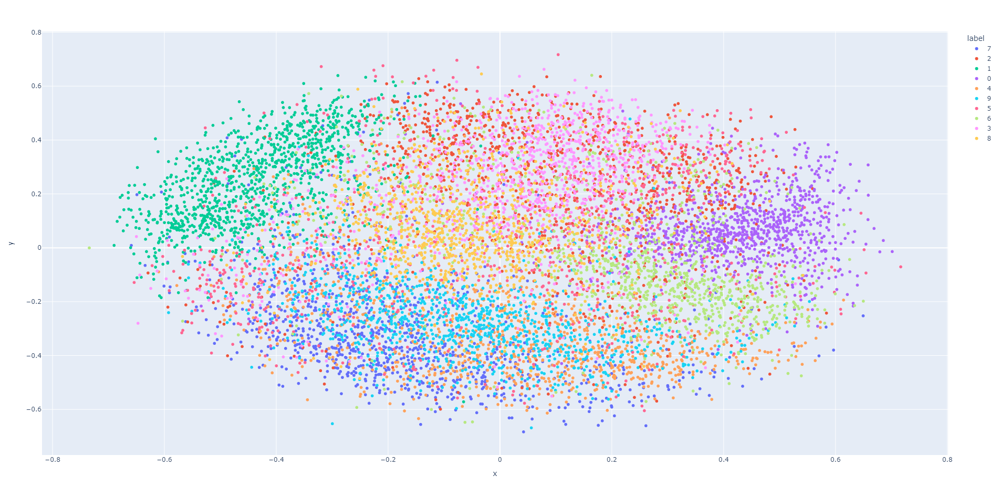

## *t-SNE*
A more recent approach to dimensional reduction is called t-distributed Stochastic Neighbor Embedding (t-SNE) with better computing time and loss function, without discussing the details, let us see how t-SNE performs on the MNIST dataset with 10000 samples.

In [ ]:
(X_mnist_1, y_mnist_1), (X_mnist_2, y_mnist_2) = mnist.load_data()
X_mnist_flat = X_mnist_2.reshape(10000, 784)

In [ ]:
scaler = MinMaxScaler(feature_range=(0,255))
scaler.fit(X_mnist_flat)
X_mnist = scaler.transform(X_mnist_flat)

In [ ]:
tsne = TSNE(n_components=2,
            perplexity=30.0,                                                                  # perplexity should be between 5 and 50
            early_exaggeration=20,                                                            # controls how tight the clusters are
            learning_rate='auto',
            n_iter=1000,
            n_iter_without_progress=300,
            min_grad_norm=1e-07,
            metric='euclidean',
            init='pca',
            verbose=1,
            method='barnes_hut'
            )

In [ ]:
X_tsne = tsne.fit_transform(X_mnist)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.008s...
[t-SNE] Computed neighbors for 10000 samples in 5.157s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 517.867193
[t-SNE] KL divergence after 250 iterations with early exaggeration: 163.324554
[t-SNE] KL divergence after 1000 iterations: 1.814306


In [ ]:
x_coords = X_tsne[:, 0]                                                          # scatterplot
y_coords = X_tsne[:, 1]

data_tsne_2d = {'x' : x_coords, 'y': y_coords, 'label' : y_mnist_2}
df_tsne_2d = pd.DataFrame(data=data_tsne_2d)

fig_tsne_2d = px.scatter(df_tsne_2d, x='x', y='y', color='label')
fig_tsne_2d.show()

In [ ]:
tsne = TSNE(n_components=2,
            perplexity=30.0,                                                                  # perplexity should be between 5 and 50
            early_exaggeration=12,                                                            # controls how tight the clusters are
            learning_rate='auto',
            n_iter=1000,
            n_iter_without_progress=300,
            min_grad_norm=1e-07,
            metric='euclidean',
            init='pca',
            verbose=1,
            method='barnes_hut'
            )

In [ ]:
X_tsne = tsne.fit_transform(X_mnist)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.009s...
[t-SNE] Computed neighbors for 10000 samples in 5.099s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 517.867193
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.606934
[t-SNE] KL divergence after 1000 iterations: 1.779074


In [ ]:
x_coords = X_tsne[:, 0]                                                          # scatterplot
y_coords = X_tsne[:, 1]

data_tsne_2d = {'x' : x_coords, 'y': y_coords, 'label' : y_mnist_2}
df_tsne_2d = pd.DataFrame(data=data_tsne_2d)

fig_tsne_2d = px.scatter(df_tsne_2d, x='x', y='y', color='label')
fig_tsne_2d.show()

How about on FMNIST?

In [ ]:
X_fmnist, y_fmnist = fetch_openml(name='Fashion-MNIST', return_X_y=True)

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning:

The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.



In [ ]:
from sklearn.model_selection import train_test_split

X_fmnist_train, X_fmnist_test, y_fmnist_train, y_fmnist_test = train_test_split(X_fmnist, y_fmnist, test_size=10000, stratify=y_fmnist)

In [ ]:
X_fmnist = X_fmnist_test
y_fmnist = y_fmnist_test

In [ ]:
fmnist_scaler = MinMaxScaler(feature_range=(0,255))
fmnist_scaler.fit(X_fmnist)
X_fmnist = fmnist_scaler.transform(X_fmnist)

In [ ]:
tsne = TSNE(n_components=2,
            perplexity=30,                                                                  # perplexity should be between 5 and 50
            early_exaggeration=12,                                                            # controls how tight the clusters are
            learning_rate='auto',
            n_iter=1000,
            n_iter_without_progress=300,
            min_grad_norm=1e-07,
            metric='euclidean',
            init='pca',
            verbose=1,
            method='barnes_hut'
            )

In [ ]:
X_tsne = tsne.fit_transform(X_fmnist)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.041s...
[t-SNE] Computed neighbors for 10000 samples in 5.097s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 433.375454
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.073990
[t-SNE] KL divergence after 1000 iterations: 1.593678


In [ ]:
x_coords = X_tsne[:, 0]                                                          # scatterplot
y_coords = X_tsne[:, 1]

data_tsne_2d = {'x' : x_coords, 'y': y_coords, 'label' : y_fmnist}
df_tsne_2d = pd.DataFrame(data=data_tsne_2d)

fig_tsne_2d = px.scatter(df_tsne_2d, x='x', y='y', color='label')
fig_tsne_2d.show()

t-SNE's performance is significantly better than that of PCA and MDS on more complicated datasets like MNIST and FMNIST. However, even on FMNIST, the result is not stellar if the presentation is in 2D.


A short introduction to t-SNE: Given $N$ datapoints $x_1, x_2, ..., x_N$ in a high-dimensional space, we define the conditional similarities by
$$ p_{j \vert i} = \dfrac{\text{exp}(-\lVert x_i - x_j \rVert^2 / 2 \sigma_i^2)}{\sum_{j' \neq i} \text{exp}(- \lVert x_i - x_{j'} \rVert^2 / 2 \sigma_i^2)}$$
then symmetrize these conditionals to obtain the similarities between points
$$p_{ij} = \dfrac{p_{j \vert i} + p_{i \vert j}}{2N}$$
Now, consider the same number of points in lower-dimensional space, let these points be denoted by $y_1, y_2, ..., y_N$, again we can measure the simlarities between point $y_i$ and $y_j$ by
$$q_{ij} = \dfrac{(1 + \lVert y_i - y_j \rVert^2)^{-1}}{\sum_{k} \sum_{l \neq k} (1 + \lVert y_k - y_l \rVert^2)^{-1}}$$
The goal of t-SNE is basically find a configuration for points $y_1, ..., y_N$ such that $q_{ij} \approx p_{ij}$, this means that local structure of this configuration is highly similar to the points' configuration in the original space.

To this point, the objective function that we aim to minimize using the model is the Kullback-Leibler Divergence:
$$KL(P \Vert Q) = \sum_i \sum_{j \neq i} p_{ij} \log{\dfrac{p_{ij}}{q_{ij}}}$$

Advantages:


*   Handles non-linear data well, unlike PCA.
*   Preserves local structures well.

Disadvantages:


*   Computational complexity: even with the Barnes-Hut variant, which significantly reduces the computing time for t-SNE on large datasets, the calculations still take quite some time to be completed.
*   Non-deterministic: Due to being dependent on point initialization, even with same values for hyperparameters, we will still end up with different results most of the time.





## *UMAP*
Considered a state-of-the-art dimensional reduction technique. Without going into too much details (because the math involved requires some very solid background), the idea behind UMAP is extremely similar to t-SNE with a few subtle differences:


*   Different choices of similarities for original and presentation space:
$$p_{j \vert i} = \exp{\Bigg(-\dfrac{d(x_i,x_j) - \rho_i}{\sigma_i} \Bigg)}$$
$$p_{ij} = (v_{j \vert i} + v_{i \vert j}) - v_{j \vert i} v_{i \vert j}$$
$$q_{ij} = (1 + a \lVert y_i - y_j \rVert^{2b})^{-1}$$
*   UMAP uses cross-entropy for loss function instead of the Kullback-Leibler Divergence.
*   UMAP uses spectral initialization, which means the resulting configurations are more stable than t-SNE which uses random initializations.
*   While t-SNE is only concerned with local structures, UMAP strives to also preserve some global structures.



In [ ]:
pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 7.9 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=385d68bd615f0b96afbdffcce6377dc7cd9c47f4468c5f2ca0ccf92d4637037d
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn


In [ ]:
(X_mnist_1, y_mnist_1), (X_mnist_2, y_mnist_2) = mnist.load_data()
X_mnist_flat = X_mnist_2.reshape(10000, 784)
scaler = MinMaxScaler(feature_range=(0,255))
scaler.fit(X_mnist_flat)
X_mnist = scaler.transform(X_mnist_flat)

In [ ]:
import umap

manifold = umap.UMAP(n_components=2, n_neighbors=20, metric='euclidean', min_dist=0.1).fit(X_mnist)

In [ ]:
X_umap = manifold.transform(X_mnist)

In [ ]:
X_umap.shape

(10000, 2)

In [ ]:
x_coords = X_umap[:, 0]                                                          # scatterplot
y_coords = X_umap[:, 1]

data_umap_2d = {'x' : x_coords, 'y': y_coords, 'label' : y_mnist_2}
df_umap_2d = pd.DataFrame(data=data_umap_2d)

fig_umap_2d = px.scatter(df_umap_2d, x='x', y='y', color='label')
fig_umap_2d.show()

In [ ]:
manifold_3d = umap.UMAP(n_components=3, n_neighbors=20, metric='euclidean', min_dist=0.1).fit(X_mnist)

In [ ]:
X_umap = manifold_3d.transform(X_mnist)
X_umap.shape

(10000, 3)

In [ ]:
x_coords = X_umap[:, 0]                                                          # scatterplot
y_coords = X_umap[:, 1]
z_coords = X_umap[:, 2]

data_umap_3d = {'x': x_coords, 'y': y_coords, 'z': z_coords, 'label': y_mnist_2}
df_umap_3d = pd.DataFrame(data=data_umap_3d)

fig_umap_3d = px.scatter_3d(df_umap_3d, x='x', y='y', z='z', color='label')
fig_umap_3d.show()

In [ ]:
X_fmnist, y_fmnist = fetch_openml(name='Fashion-MNIST', return_X_y=True)

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning:

The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.



In [ ]:
fmnist_scaler = MinMaxScaler(feature_range=(0,255))
fmnist_scaler.fit(X_fmnist)
X_fmnist = fmnist_scaler.transform(X_fmnist)

In [ ]:
manifold = umap.UMAP(n_components=2, n_neighbors=20, metric='euclidean', min_dist=0.1).fit(X_fmnist)

In [ ]:
X_umap = manifold.transform(X_fmnist)

In [ ]:
x_coords = X_umap[:, 0]                                                          # scatterplot
y_coords = X_umap[:, 1]

data_umap_2d = {'x' : x_coords, 'y': y_coords, 'label' : y_fmnist}
df_umap_2d = pd.DataFrame(data=data_umap_2d)

fig_umap_2d = px.scatter(df_umap_2d, x='x', y='y', color='label')
fig_umap_2d.show()

In [ ]:
manifold = umap.UMAP(n_components=3, n_neighbors=20, metric='euclidean', min_dist=0.1).fit(X_fmnist)

In [ ]:
X_umap = manifold.transform(X_fmnist)
X_umap.shape

(70000, 3)

In [ ]:
x_coords = X_umap[:, 0]                                                          # scatterplot
y_coords = X_umap[:, 1]
z_coords = X_umap[:, 2]

data_umap_3d = {'x': x_coords, 'y': y_coords, 'z': z_coords, 'label': y_fmnist}
df_umap_3d = pd.DataFrame(data=data_umap_3d)

fig_umap_3d = px.scatter_3d(df_umap_3d, x='x', y='y', z='z', color='label')
fig_umap_3d.show()

## *Exploratory Data Analysis with t-SNE and UMAP*
Results from t-SNE and UMAP do, sometimes, tell us more interesting information about the data within the dataset. We will try to deploy TensorBoard on MNIST and FMNIST to try and see this.

# MNIST

In [ ]:
(X_mnist_1, y_mnist_1), (X_mnist_2, y_mnist_2) = mnist.load_data()
X_mnist_new = X_mnist_2

11490434/11490434 [==============================] - 0s 0us/step


In [ ]:
X_mnist, X_mnist_out, y_mnist, y_mnist_out = train_test_split(X_mnist_new, y_mnist_2, test_size=5100, stratify=y_mnist_2, random_state=42)                               # taking 5000 samples only because tensorboard does not take more than 5000.

In [ ]:
X_mnist = 255-X_mnist                                                                                                                                                    # inverting the pictures' colors to get better label in TensorBoard
X_mnist.shape

(4900, 28, 28)

In [ ]:
scaler = MinMaxScaler(feature_range=(0,255))

In [ ]:
X_mnist_flat = X_mnist.reshape(4900, 28*28)
X_mnist_flat.shape

(4900, 784)

In [ ]:
scaler.fit(X_mnist_flat)
X_mnist_flat = scaler.transform(X_mnist_flat)

In [ ]:
cd '/content/sample_data/sprite_data'

/content/sample_data/sprite_data


In [ ]:
# rm -rf /content/sample_data/sprite_data

In [ ]:
def pic_convert(data):                                                                                                                                   # code for png generation of the dataset
  for i in range(len(data)):
    arr_recon = np.reshape(data[i], (28,28))
    pic_data = im.fromarray(arr_recon)
    pic_data = pic_data.convert("L")
    pic_data.save('{:0>8}'.format(f'{i}.png'))

pic_convert(X_mnist)

In [ ]:
!zip -r MNIST.zip /content/sample_data/sprite_data

  adding: content/sample_data/sprite_data/ (stored 0%)
  adding: content/sample_data/sprite_data/2729.png (deflated 0%)
  adding: content/sample_data/sprite_data/1658.png (stored 0%)
  adding: content/sample_data/sprite_data/3196.png (stored 0%)
  adding: content/sample_data/sprite_data/0799.png (stored 0%)
  adding: content/sample_data/sprite_data/2421.png (stored 0%)
  adding: content/sample_data/sprite_data/2587.png (stored 0%)
  adding: content/sample_data/sprite_data/4393.png (stored 0%)
  adding: content/sample_data/sprite_data/4569.png (stored 0%)
  adding: content/sample_data/sprite_data/3494.png (stored 0%)
  adding: content/sample_data/sprite_data/3253.png (stored 0%)
  adding: content/sample_data/sprite_data/3245.png (stored 0%)
  adding: content/sample_data/sprite_data/0221.png (deflated 2%)
  adding: content/sample_data/sprite_data/1057.png (stored 0%)
  adding: content/sample_data/sprite_data/3123.png (deflated 1%)
  adding: content/sample_data/sprite_data/3292.png (store

In [ ]:
from google.colab import files
files.download('MNIST.zip')                                                               # downloading all the png files generated as this is necessary for getting picture labels in TensorBoard

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_mnist = pd.DataFrame(X_mnist_flat)
df_mnist.to_csv('/content/sample_data/feature_data/mnist_features.tsv', sep='\t')

In [ ]:
df_label = pd.DataFrame(y_mnist)
df_label.to_csv('/content/sample_data/feature_data/mnist_labels.tsv', sep='\t', index=False, header=False)

Details are discussed with local codes ran on TensorBoard.

# FMNIST

In [22]:
X_fmnist, y_fmnist = fetch_openml(name='Fashion-MNIST', return_X_y=True)

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


In [23]:
X_fmnist, X_fmnist_out, y_fmnist, y_fmnist_out = train_test_split(X_fmnist, y_fmnist, test_size=65100, stratify=y_fmnist, random_state=42)                               # taking 4900 samples only because tensorboard does not take more than 5000

In [24]:
X_fmnist = 255-X_fmnist                                                                                                                                                  # inverting the pictures' colors to get better label in TensorBoard
type(X_fmnist), X_fmnist.shape

(pandas.core.frame.DataFrame, (4900, 784))

In [25]:
scaler = MinMaxScaler(feature_range=(0,255))
X_fmnist = scaler.fit_transform(X_fmnist)

In [27]:
X_fmnist_pics = X_fmnist.reshape(-1, 28, 28)                                                                                                                              # reshape so they can be read as pics
type(X_fmnist_pics), X_fmnist_pics.shape

(numpy.ndarray, (4900, 28, 28))

In [28]:
cd '/content/sample_data/sprite_data'

/content/sample_data/sprite_data


In [ ]:
# rm -rf /content/sample_data/sprite_data

In [29]:
def pic_convert(data):                                                                                                                                   # code for png generation of the dataset
  for i in range(len(data)):
    arr_recon = np.reshape(data[i], (28,28))
    pic_data = im.fromarray(arr_recon)
    pic_data = pic_data.convert("L")
    pic_data.save('{:0>8}'.format(f'{i}.png'))

pic_convert(X_fmnist_pics)

In [41]:
!zip -r FMNIST.zip /content/sample_data/sprite_data

  adding: content/sample_data/sprite_data/ (stored 0%)
  adding: content/sample_data/sprite_data/2729.png (stored 0%)
  adding: content/sample_data/sprite_data/1658.png (stored 0%)
  adding: content/sample_data/sprite_data/3196.png (stored 0%)
  adding: content/sample_data/sprite_data/0799.png (stored 0%)
  adding: content/sample_data/sprite_data/2421.png (stored 0%)
  adding: content/sample_data/sprite_data/2587.png (stored 0%)
  adding: content/sample_data/sprite_data/4393.png (stored 0%)
  adding: content/sample_data/sprite_data/4569.png (stored 0%)
  adding: content/sample_data/sprite_data/3494.png (stored 0%)
  adding: content/sample_data/sprite_data/3253.png (stored 0%)
  adding: content/sample_data/sprite_data/3245.png (stored 0%)
  adding: content/sample_data/sprite_data/0221.png (stored 0%)
  adding: content/sample_data/sprite_data/1057.png (stored 0%)
  adding: content/sample_data/sprite_data/3123.png (stored 0%)
  adding: content/sample_data/sprite_data/3292.png (stored 0%)


In [42]:
from google.colab import files
files.download('FMNIST.zip')                                                               # downloading all the png files generated as this is necessary for getting picture labels in TensorBoard

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [47]:
df_fmnist = pd.DataFrame(X_fmnist)
df_fmnist.to_csv('/content/sample_data/feature_data/fmnist_features.tsv', sep='\t')

In [48]:
df_label = pd.DataFrame(y_fmnist)
df_label.to_csv('/content/sample_data/feature_data/fmnist_labels.tsv', sep='\t', index=False, header=False)

Details are discussed with local codes ran on TensorBoard.

Overall, t-SNE and UMAP are extremely effective tools for exploratory data analysis (from the perspective that we can map out the data in low dimensional space and then try to see the differences/similarities between the datapoints) and model/dataset evaluation (in the sense that we can evaluate the model's effectiveness in feature extraction, good feature extraction means better clustering of same-labeled datapoints, or pinpoint the dataset's nuances that requires special attention during the modeling process).